In [16]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import gaussian
from skimage.segmentation import active_contour
from skimage import exposure
from skimage.color import gray2rgb
from IPython import display

# EYE VIDEO

/tmp/ipykernel_67438/3353172577.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(7, 7))


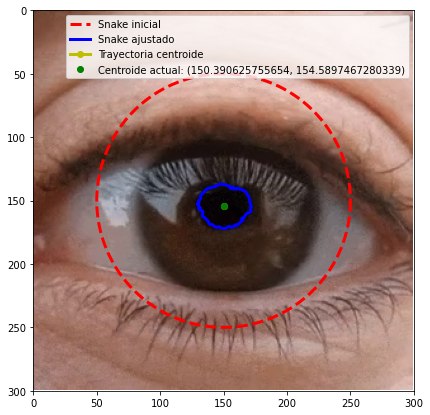

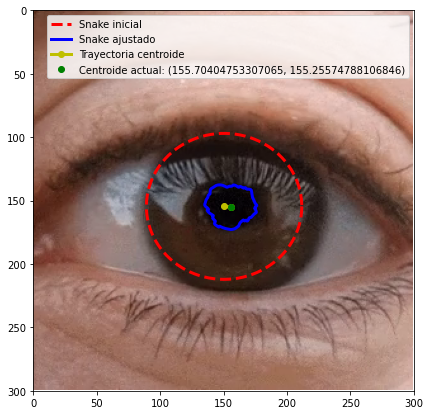

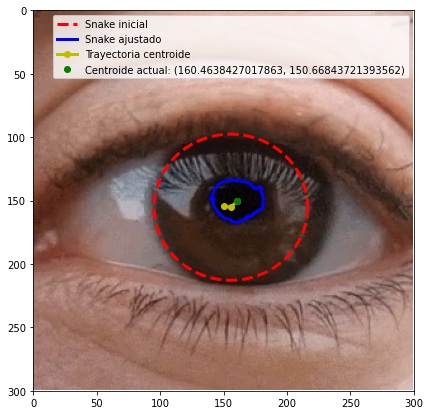

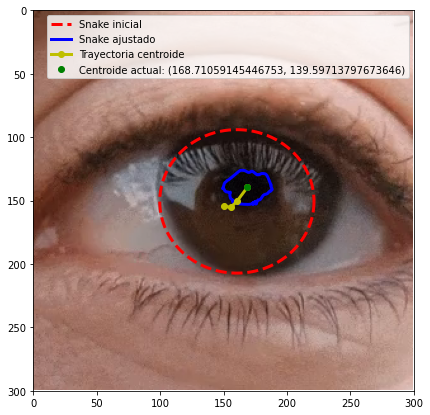

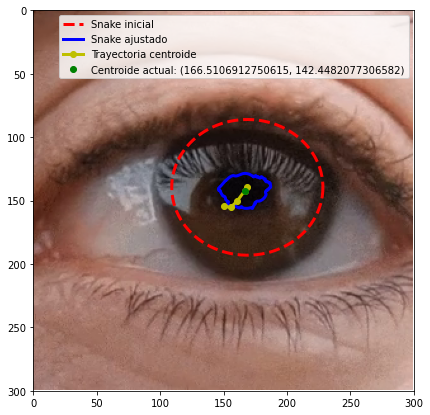

...

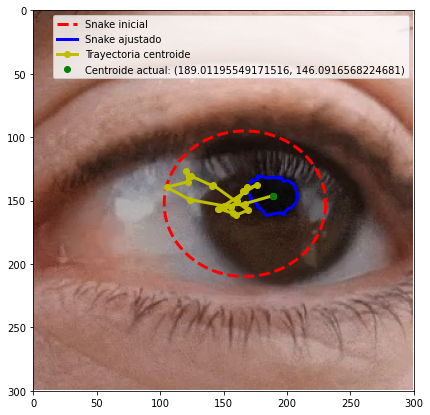

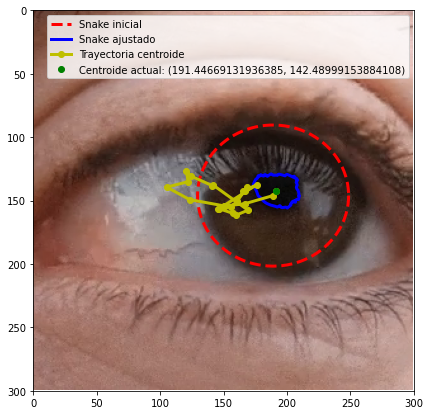

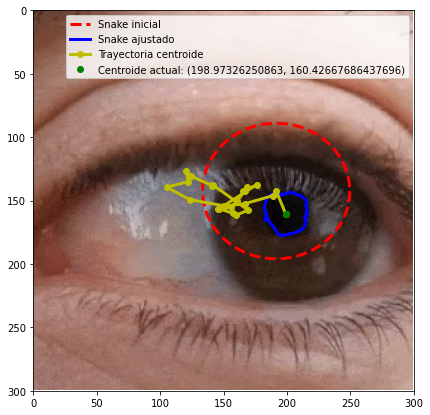

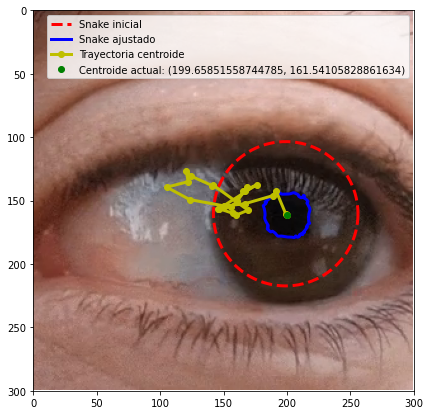

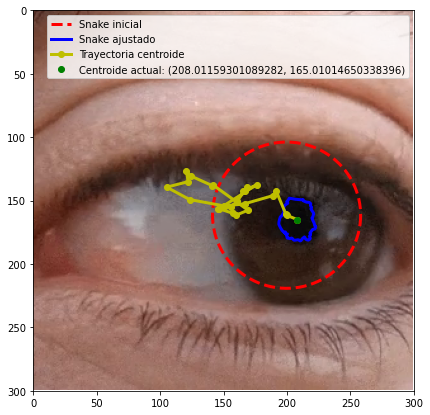

In [1]:
#cargamos el video
cap = cv2.VideoCapture('eye.mp4')
lcent_x = []
lcent_y = []
size = []

success,image = cap.read()
while success:
    success, image = cap.read()
    
    #generamos los puntos iniciales del snake
    s = np.linspace(0, 2*np.pi, 200)
    if (len(lcent_x) > 0):
        #el centro y dimensiones dependen del anterior
        r = lcent_y[-1] + (size[-1][1] + 40)*np.sin(s)
        c = lcent_x[-1] + (size[-1][0] + 40)*np.cos(s)
    else:
        r = (image.shape[0] / 2.0) + 100*np.sin(s)
        c = (image.shape[1] / 2.0) + 100*np.cos(s)
    init = np.array([r, c]).T
    
    if success:
        #filtro umbral sobre el componente rojo
        thres_img = image[:,:, 2] > 20;
        #filtro gaussiano
        gaus_img = gaussian(thres_img, 3, preserve_range=False, multichannel=False)
        #calculamos el snake a la parte roja con un umbral de 20 
        snake = active_contour(gaus_img, init, alpha=0.01, beta=10, gamma=0.0005, coordinates='rc')
        #calculamos el centroide del snake
        max_x, max_y = 0, 0
        min_x, min_y = image.shape[1], image.shape[0]
        for y, x in snake:
            max_x = max(x, max_x)
            min_x = min(x, min_x)
            max_y = max(y, max_y)
            min_y = min(y, min_y)

        lcent_x.append(min_x + ((max_x - min_x)/2.0))
        lcent_y.append(min_y + ((max_y - min_y)/2.0))
        size.append([(max_x - min_x)/2.0, (max_y - min_y)/2.0]);
        
        #mostarmos la imagen
        fig, ax = plt.subplots(figsize=(7, 7))
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax.plot(init[:, 1], init[:, 0], '--r', lw=3)
        ax.plot(snake[:, 1], snake[:, 0], '-b', lw=3)
        ax.plot(lcent_x, lcent_y, 'y-o', lw=3)
        ax.plot(lcent_x[-1], lcent_y[-1], 'go', lw=3)
        ax.legend(["Snake inicial", "Snake ajustado", 
                    "Trayectoria centroide", 
                    "Centroide actual: ("+str(lcent_x[-1])+", "+str(lcent_y[-1])+")"])
        ax.axis([0, image.shape[1], image.shape[0], 0])
    else:
        break

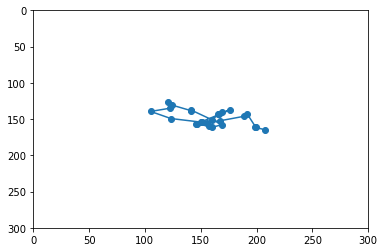

In [2]:
#Graficamos el camino que tomo el ojo
plt.xlim(0.0, 300.0)
plt.ylim(300.0, 0.0)
plt.plot(lcent_x, lcent_y, 'o-')
plt.show()

# CAR VIDEO

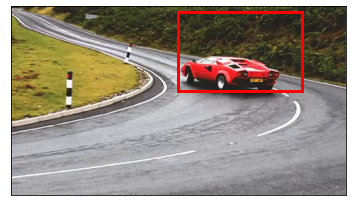

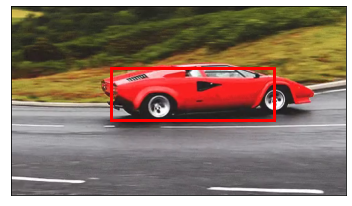

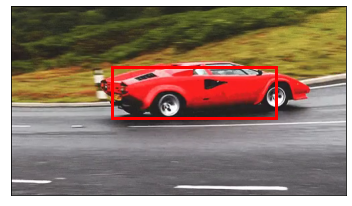

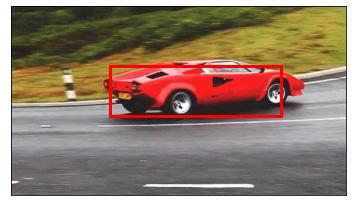

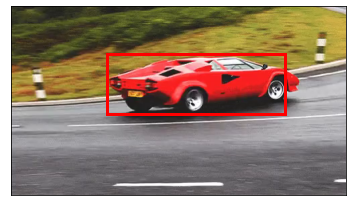

...

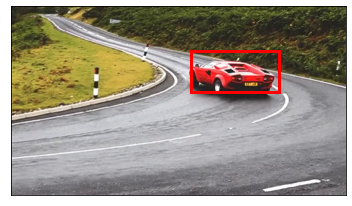

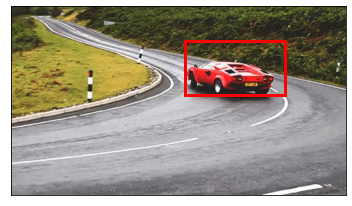

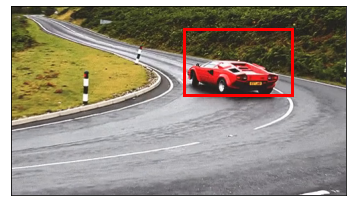

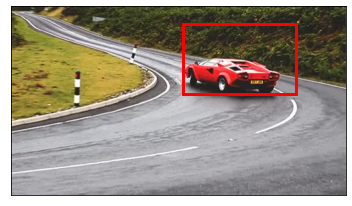

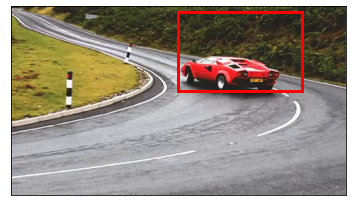

In [15]:
#cargamos el video
cap = cv2.VideoCapture('Red_car.mp4')
success,image = cap.read()
#centro y tamaños del snake
lcent_x = []
lcent_y = []
size = []

while cap.isOpened():
    try:
        success,image = cap.read()
        #generamos los puntos iniciales del snake
        s = np.linspace(0, 2*np.pi, 200)
        if (len(lcent_x) > 0):
            r = lcent_y[-1] + (size[-1][1] + 10)*np.sin(s)
            c = lcent_x[-1] + (size[-1][0] + 10)*np.cos(s)
        else:
            r = (image.shape[0] / 2.0) + 80*np.sin(s)
            c = (image.shape[1] / 2.0) + 150*np.cos(s)

        init = np.array([r, c]).T
        if success:
            sobel_img = image[:, :, 2] > 35
            gauss_img = gaussian(sobel_img, 3, preserve_range=False, multichannel=True)
            snake = active_contour(gauss_img, init, alpha=0.1, beta=30, gamma=0.00002, coordinates='rc')
            
            #calculamos el bounding box a partir de los puntos del snake
            max_x, max_y = 0, 0
            min_x, min_y = image.shape[1], image.shape[0]
            for y, x in snake:
                max_x = max(x, max_x)
                min_x = min(x, min_x)
                max_y = max(y, max_y)
                min_y = min(y, min_y)
            lcent_x.append(min_x + ((max_x - min_x)/2.0))
            lcent_y.append(min_y + ((max_y - min_y)/2.0))
            size.append([(max_x - min_x)/2.0, (max_y - min_y)/2.0]);
            
            #mostramos la imagen con el bounding box
            fig, ax = plt.subplots()
            #ax.plot(init[:, 1], init[:, 0], '--y', lw=3)
            #ax.plot(snake[:, 1], snake[:, 0], '-b', lw=3)
            rect = plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, edgecolor='r', facecolor='none', lw=3)
            ax.add_patch(rect)
            ax.set_xticks([]), ax.set_yticks([])
            ax.axis([0, image.shape[1], image.shape[0], 0])
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            
            #quitamos la imagen para que parezca una animacion
            display.clear_output(wait=True)
            display.display(plt.gcf())
            
        else:
            cap.release()
    except KeyboardInterrupt:
        cap.release()
